In [51]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
import pandas as pd
import cartopy.crs as ccrs
#import wradlib
import pyart
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()


In [52]:
radar = nc.Dataset('MDV-20150805-084449-PPIVol.nc')

In [53]:
data_dbz=radar.variables['DBZH'][:].data

data_dbz[data_dbz==-32768]=np.nan
data_dbz.shape
mask_dbzh=radar.variables['DBZH'][:].mask
vleh=pd.DataFrame(radar.variables['VELH'][:].data)
vleh=vleh.replace(-32768,np.nan)
#vleh=vleh.values*mask_dbzh


In [54]:
~mask_dbzh

array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])

In [55]:
np_vleh=pd.DataFrame(vleh)
pd_dbzh=pd.DataFrame(~mask_dbzh)
vleh111=np_vleh[pd_dbzh]

In [56]:
vleh111.shape

(9270, 2500)

In [57]:

rad = pyart.io.read('MDV-20150805-084449-PPIVol.nc')
mask_dict = {'data': vleh111, 'units': 'm/s', 'long_name': 'corr_vel',
            'standard_name': 'vleh'}
rad.add_field('vleh111',mask_dict)

In [58]:
rad.fields.keys()

dict_keys(['DBZH', 'DBZV', 'VELH', 'VELV', 'vleh111'])

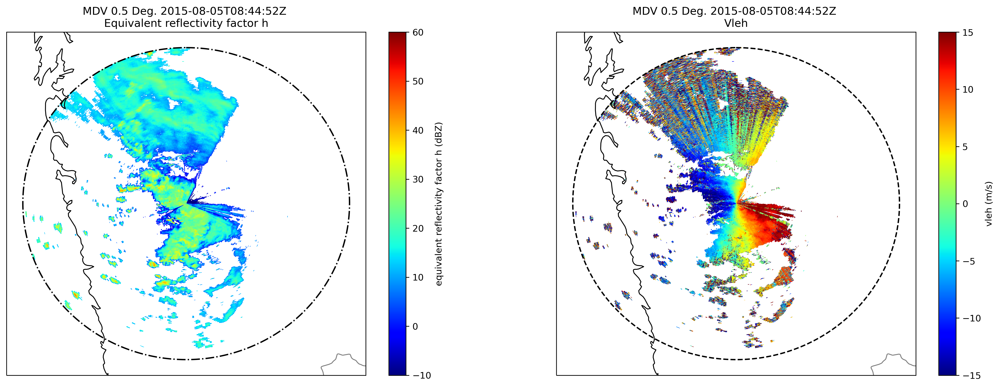

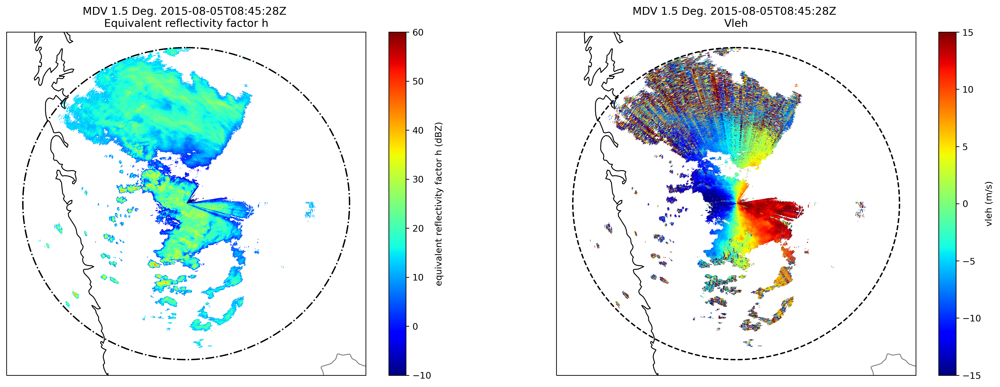

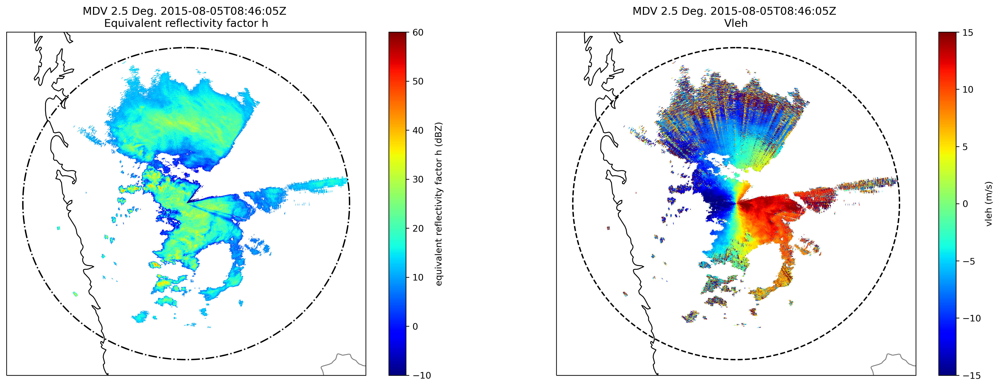

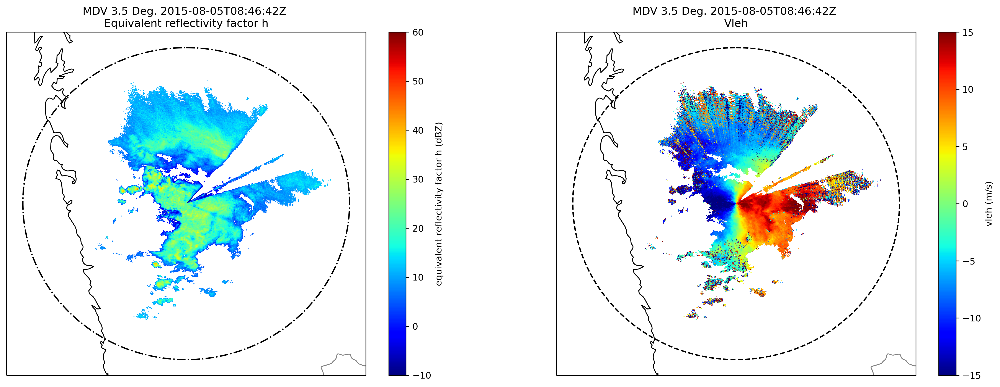

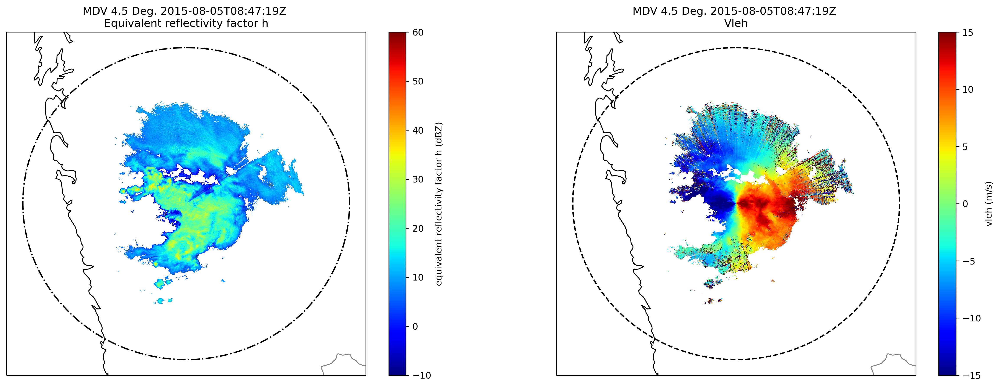

...

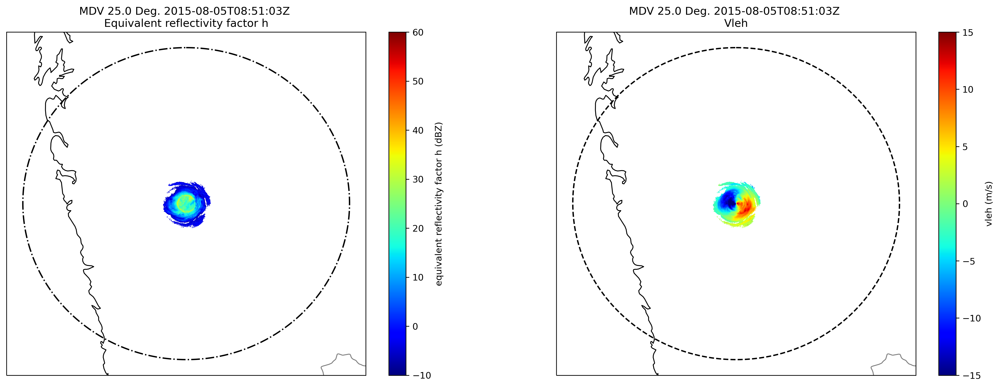

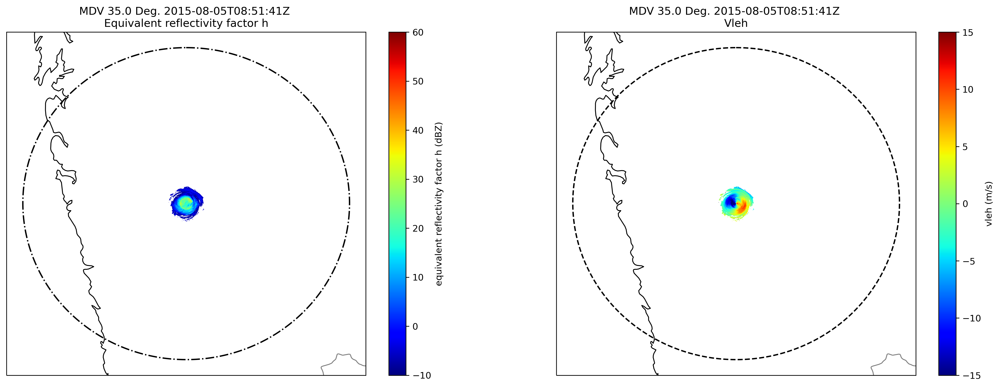

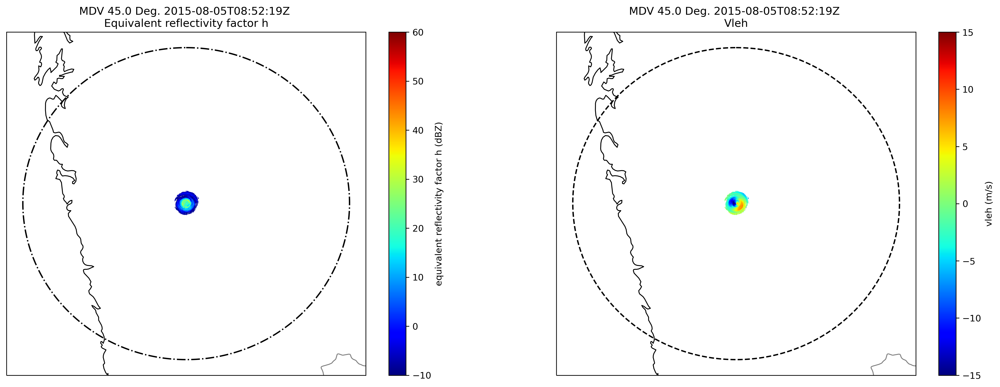

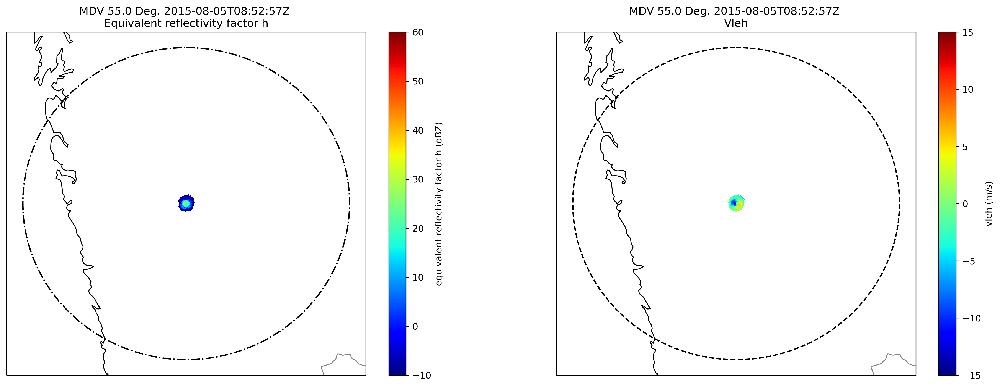

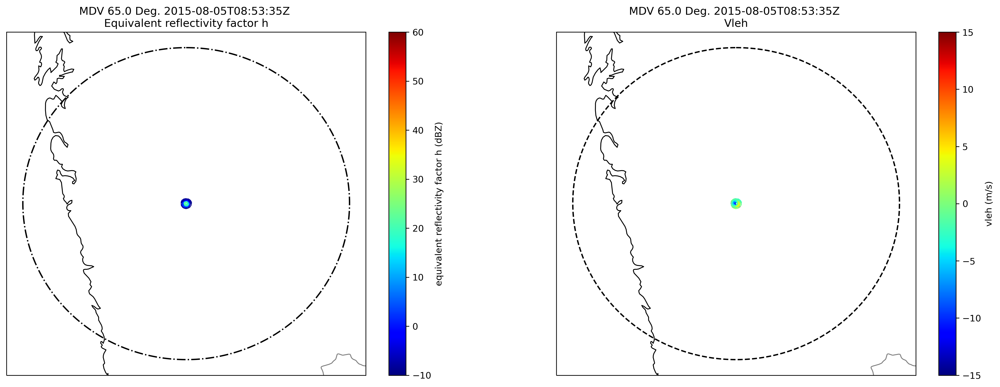

In [69]:
import netCDF4 as nc
for i in range(15):
    fig = plt.figure(figsize=[20,7],dpi=300)
    ax = plt.subplot(1,2,1,projection=ccrs.PlateCarree())
    display = pyart.graph.RadarMapDisplay(rad)
    display.plot_ppi_map('DBZH',sweep=i, resolution='10m',
                         vmin=-10, vmax=60,
                         projection=ccrs.PlateCarree(), cmap='jet',)
    display.plot_range_ring(rad.range['data'][2], line_style='k-.')

    ax = plt.subplot(1,2,2,projection=ccrs.PlateCarree())
    display = pyart.graph.RadarMapDisplay(rad)
    display.plot_ppi_map('vleh111', sweep=i, resolution='10m',
                         vmin = -15, vmax = 15,
                         projection=ccrs.PlateCarree(),cmap='jet')
    display.plot_range_ring(rad.range['data'][2], line_style='k--')
    #fig.tight_layout()
    plt.savefig(r'/Users/rizvi/Documents/Project/Jup/plots'+'//'+'MDV-20150805-084449-PPIVol'+ str(i+1) +'.jpg')
    #plt.clf()
    #plt.show()